<a href="https://colab.research.google.com/github/Kiran-Venkatesh/KV/blob/master/JOB_A_THON_Nov_2022_Kiran.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

In [ ]:
df = pd.read_csv('/content/train_data.csv')
df.dropna(inplace= True)
df.reset_index(drop=True, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93092 entries, 0 to 93091
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   row_id    93092 non-null  int64  
 1   datetime  93092 non-null  object 
 2   energy    93092 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 2.1+ MB


In [ ]:
df.head()

,row_id,datetime,energy
0,1,2008-03-01 00:00:00,1259.985563
1,2,2008-03-01 01:00:00,1095.541500
2,3,2008-03-01 02:00:00,1056.247500
3,4,2008-03-01 03:00:00,1034.742000
4,5,2008-03-01 04:00:00,1026.334500


In [ ]:
df.tail()

,row_id,datetime,energy
93087,94988,2018-12-31 19:00:00,2528.4468
93088,94989,2018-12-31 20:00:00,2461.8836
93089,94990,2018-12-31 21:00:00,2365.9944
93090,94991,2018-12-31 22:00:00,2342.9428
93091,94992,2018-12-31 23:00:00,2180.2176


In [ ]:
df=df[["datetime","energy"]]
df.head()

,datetime,energy
0,2008-03-01 00:00:00,1259.985563
1,2008-03-01 01:00:00,1095.541500
2,2008-03-01 02:00:00,1056.247500
3,2008-03-01 03:00:00,1034.742000
4,2008-03-01 04:00:00,1026.334500


Change Column Names for FB Prophet

In [ ]:
df.columns = ['ds','y']
df['ds'] = pd.to_datetime(df['ds'])
df.tail()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,ds,y
93087,2018-12-31 19:00:00,2528.4468
93088,2018-12-31 20:00:00,2461.8836
93089,2018-12-31 21:00:00,2365.9944
93090,2018-12-31 22:00:00,2342.9428
93091,2018-12-31 23:00:00,2180.2176


Plot Your Data

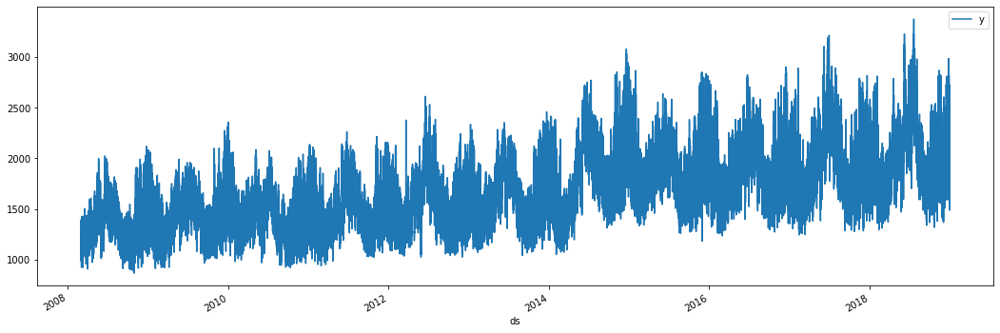

In [ ]:
df.plot(x='ds',y='y',figsize=(18,6))

In [ ]:
len(df)

93092

Train, Test Split

In [ ]:
train = df.iloc[:len(df)-365]
test = df.iloc[len(df)-365:]

Start Making Predictions

In [ ]:
m = Prophet()
m.fit(train)
future = m.make_future_dataframe(periods=365,freq='H') #MS for monthly, H for hourly
forecast = m.predict(future)

In [ ]:
print(len(forecast),len(test))

93092 365


In [ ]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
93087,2018-12-31 13:00:00,2057.816731,1893.627704,2325.519020,2057.816731,2057.816731,52.930272,52.930272,52.930272,102.571904,...,-143.886109,-143.886109,-143.886109,94.244477,94.244477,94.244477,0.0,0.0,0.0,2110.747003
93088,2018-12-31 14:00:00,2057.823110,1904.410858,2345.087323,2057.823110,2057.823110,64.448991,64.448991,64.448991,108.875648,...,-138.450241,-138.450241,-138.450241,94.023584,94.023584,94.023584,0.0,0.0,0.0,2122.272100
93089,2018-12-31 15:00:00,2057.829488,1904.413866,2358.647808,2057.829488,2057.829488,70.098147,70.098147,70.098147,108.826756,...,-132.531333,-132.531333,-132.531333,93.802724,93.802724,93.802724,0.0,0.0,0.0,2127.927635
93090,2018-12-31 16:00:00,2057.835867,1925.136753,2352.517333,2057.835867,2057.835867,72.225426,72.225426,72.225426,104.806433,...,-126.162913,-126.162913,-126.162913,93.581906,93.581906,93.581906,0.0,0.0,0.0,2130.061292
93091,2018-12-31 17:00:00,2057.842245,1922.434021,2371.775901,2057.842245,2057.842245,80.356670,80.356670,80.356670,106.376994,...,-119.381461,-119.381461,-119.381461,93.361137,93.361137,93.361137,0.0,0.0,0.0,2138.198915


In [ ]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
93087,2018-12-31 13:00:00,2110.747003,1893.627704,2325.519020
93088,2018-12-31 14:00:00,2122.272100,1904.410858,2345.087323
93089,2018-12-31 15:00:00,2127.927635,1904.413866,2358.647808
93090,2018-12-31 16:00:00,2130.061292,1925.136753,2352.517333
93091,2018-12-31 17:00:00,2138.198915,1922.434021,2371.775901


In [ ]:
test.tail()

,ds,y
93087,2018-12-31 19:00:00,2528.4468
93088,2018-12-31 20:00:00,2461.8836
93089,2018-12-31 21:00:00,2365.9944
93090,2018-12-31 22:00:00,2342.9428
93091,2018-12-31 23:00:00,2180.2176


USING BUILT-IN FB PROPHET VISUALIZATION

In [ ]:
plot_plotly(m ,forecast)

In [ ]:
plot_components_plotly(m, forecast)

Evaluate Your Model

In [ ]:
from statsmodels.tools.eval_measures import rmse

In [ ]:
predictions = forecast.iloc[-365:]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and  predicted values:  353.21288253479486
Mean Value of Test Dataset: 2243.5666180821922


Read Test Data

In [ ]:
tf = pd.read_csv('/content/test_data.csv')
tf.dropna(inplace= True)
tf.reset_index(drop=True, inplace=True)

In [ ]:
tf.head()

,row_id,datetime
0,94993,2019-01-01 00:00:00
1,94994,2019-01-01 01:00:00
2,94995,2019-01-01 02:00:00
3,94996,2019-01-01 03:00:00
4,94997,2019-01-01 04:00:00


In [ ]:
tf=tf[['datetime']]
tf.columns=['ds']
tf['ds']=pd.to_datetime(tf['ds'])
tf.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds
0,2019-01-01 00:00:00
1,2019-01-01 01:00:00
2,2019-01-01 02:00:00
3,2019-01-01 03:00:00
4,2019-01-01 04:00:00


Modelling on full data

In [ ]:
model = Prophet()
model.fit(df)

In [ ]:
predictions=model.predict(tf)

In [ ]:
print(len(tf),len(predictions))

26304 26304


In [ ]:
print(predictions[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())

                   ds         yhat   yhat_lower   yhat_upper
0 2019-01-01 00:00:00  2022.676124  1783.228916  2262.491393
1 2019-01-01 01:00:00  1947.208955  1734.052731  2160.315028
2 2019-01-01 02:00:00  1892.105751  1659.318631  2098.988981
3 2019-01-01 03:00:00  1864.036263  1628.079206  2091.023029
4 2019-01-01 04:00:00  1868.153224  1631.519890  2076.735683


Plot the forecast test data predictions

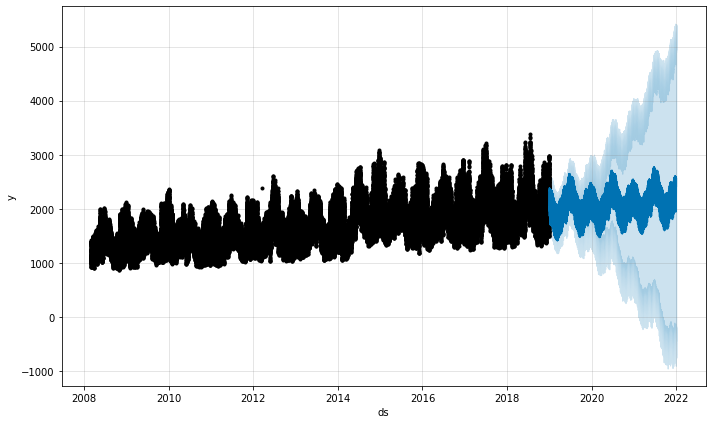

In [ ]:
# plot forecast
from matplotlib import pyplot
model.plot(predictions)
pyplot.show()

In [ ]:
sample = pd.read_csv('/content/test_data.csv')
sample.head()

,row_id,datetime
0,94993,2019-01-01 00:00:00
1,94994,2019-01-01 01:00:00
2,94995,2019-01-01 02:00:00
3,94996,2019-01-01 03:00:00
4,94997,2019-01-01 04:00:00


In [ ]:
final=pd.concat([sample['row_id'],predictions['yhat']],axis=1)
final.tail()

,row_id,yhat
26299,121292,2556.812605
26300,121293,2569.845354
26301,121294,2554.180806
26302,121295,2501.129148
26303,121296,2418.617896


In [ ]:
final.columns=['row_id','energy']
final.to_csv("FB_Prophet_Predictions.csv",index=False)